## Import Library

In [113]:
import os
import random
import cv2 as cv
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

Cell code di atas merupakan bagaian "Import Library" yang berisi proses import pustaka-pustaka yang akan digunakan dalam menjalankan kode program. Pustaka-pustaka yang di-import di antaranya, yaitu:
- Pustaka "matplotlib.pyplot" digunakan untuk proses mambaca dan menampilkan gambar, serta visualisasi data, yang dialiaskan sebagai "plt".
- Pustaka "cv2" digunakan untuk membaca, menampilkan, dan memanipulasi gambar, yang dialiaskan sebagai "cv".
- Pustaka "numpy" digunakan untuk operasi numerik dan pembuatan array numpy, yang dialiaskan sebagai "np".
- Pustaka "os" digunakan untuk operasi sistem seperti membaca file dan memnyimpan/membuat direktori file.
- Pustaka "random" digunakan untuk operasi acak, yang berguna dalam proses visualisasi sample gambar.
- Pustaka "pandas" digunakan untuk manipulasi data dan pembuatan DataFrame untuk data hasil ekstraksi.
- Pustaka "seaborn" digunakan untuk visualisasi data, seperti menampilkan diagram heatmap hasil evaluasi model.
- Pustaka "sklearn" digunakan untuk proses modelling dan evaluasi.
- "train_test_split" digunakan untuk membagi dataset menjadi subset data pelatihan dan data pengujian.
- "sklearn.neighbors import KNeighborsClassifier" digunakan untuk proses klasifikasi dengan mencari sejumlah k tetangga terdekat dari sampel baru dan kemudian memprediksi label berdasarkan mayoritas tetangga tersebut.
- "from sklearn.svm import SVC" digunakan untuk proses klasifikasi dengan mengimplementasikan Support Vector Classification (SVM) yang mencari hyperplane terbaik yang memisahkan kelas-kelas dalam data dengan margin maksimum.
- "from sklearn.ensemble import RandomForestClassifier" digunakan untuk proses klasifikasi dengan  metode ensemble yang membangun sejumlah besar pohon keputusan dan menggabungkan hasilnya untuk meningkatkan akurasi dan mengurangi overfitting.
- "precision_score, recall_score, f1_score, confusion_matrix" dalah fungsi dari sklearn.metrics yang menghitung akurasi klasifikasi, presisi klasifikasi, recall (sensitivitas) klasifikasi, F1 score yaitu rata-rata harmonis dari presisi dan recall.

## Data Loading

In [114]:
folders = [
    "dataset/black_rot/",
    "dataset/esca_black_measles/",
    "dataset/healthy/"
]
data = []
labels = []
file_name = []
for folder in folders:
    label = folder.split('_')[-1]
    dataset = os.listdir(folder)
    for file in dataset:
        image_path = os.path.join(folder, file)
        name = os.path.splitext(file)[0]
        temp = cv.imread(image_path)
        resized_img = cv.resize(temp, (300, 300), interpolation=cv.INTER_NEAREST)
        data.append(resized_img)
        labels.append(label)
        file_name.append(name)

Cell code di atas bertujuan untuk membaca gambar dari ketiga subfolder yang berbeda, dan melakukan pra-pemrosesan pada gambar-gambar tersebut, dan menyimpan data gambar serta label yang sesuai ke dalam list. Deklarasi "folders" merupakan suatu list yang berisi path dari masing-masing folder gambar. Deklarasi "data" merupakan list kosong yang akan diisi dengan gambar-gambar yang telah diproses. Deklarasi "labels" merupakan suatu list kosong yang akan diisi dengan label dari masing-masing gambar. Deklarasi "file_name" merupakan list kosong yang akan diisi dengan nama file dari masing-masing gambar. Selanjutnya yaitu melakukan inisialisasi label dan data gambar ke dalam list dengan menggunakan looping melalui setiap folder di dalam "folders". Untuk nama label yang diambil adalah bagian terakhir setelah karakter "_". Kemudian dilakukan pembacaan gambar di dalam folder dengan menggunakan os.listdir(folder), yang mengembalikan list nama file dalam folder tersebut. Pada saat looping untuk membaca setiap gambar dilakukan proses untuk membuat path serta nama file dari setiap gambar yang dilalui kemudian gambar dibaca dengan "cv.imread" dan di-resize dengan "cv.resize" menggunakan library "cv" menjadi ukuran 300x300. Setiap data gambar, label, dan nama file yang telah didapatkan di setiap iterasi akan dimasukkan ke dalam list dengan "append".

In [115]:
print(labels[330])

dataset/healthy/


Cell code di atas digunakan untuk mencetak label dari gambar ke-331 dalam urutan yang disimpan dalam daftar "labels" untuk memeriksa apakah proses pemuatan dan pelabelan gambar berjalan dengan benar dan sesuai urutan.

Cell code di bawah bertujuan untuk menghitung jumlah gambar dalam setiap subfolder yang berbeda, dan memvisualisasikan distribusi data tersebut dalam bentuk grafik batang, dan menampilkan jumlah gambar dalam setiap subfolder. Deklarasi count_data merupakan suatu dictionary kosong yang akan diisi dengan jumlah gambar dari masing-masing folder. Dilakukan looping melalui setiap folder di dalam "folders", dan setiap nama folder dijadikan kunci (key) dalam "count_data" serta nilai (value)-nya adalah jumlah gambar dalam folder tersebut yang dihitung menggunakan "len(os.listdir(folder))". Setelah itu, "plt.bar" digunakan untuk membuat grafik batang dengan kunci "count_data" sebagai label sumbu-x dan nilai count_data sebagai tinggi batang. Deklarasi "plt.title('Visualisasi Distribusi Data')" memberikan judul pada grafik. Deklarasi "plt.show()" digunakan untuk menampilkan grafik. Terakhir, "count_data.values()" digunakan untuk menampilkan jumlah gambar dalam setiap subfolder sebagai output.

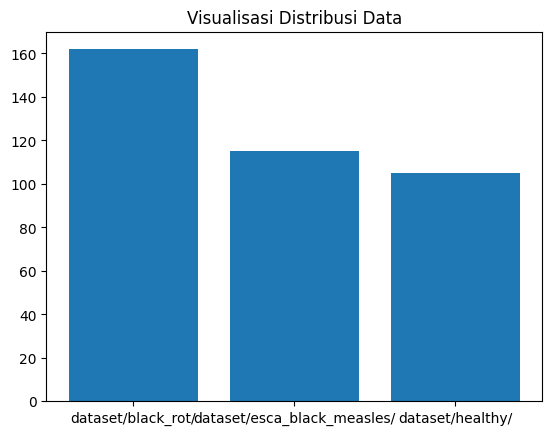

In [116]:
count_data = {}
for folder in folders:
    count_data[folder] = len(os.listdir(folder))

plt.bar(count_data.keys(), count_data.values())
plt.title('Visualisasi Distribusi Data')
plt.show()

In [117]:
def plot_samples(data, labels, stage_name, num_samples=5):
    unique_labels = np.unique(labels)
    fig, axes = plt.subplots(len(unique_labels), num_samples, figsize=(num_samples*3, len(unique_labels)*3))
    fig.suptitle(stage_name, fontsize=16)
    
    for i, label in enumerate(unique_labels):
        indices = [idx for idx, l in enumerate(labels) if l == label]
        sample_indices = random.sample(indices, num_samples)
        for j, sample_idx in enumerate(sample_indices):
            axes[i, j].imshow(data[sample_idx], cmap='gray')
            axes[i, j].axis('off')
            if j == 2:
                axes[i, j].set_title(f'Label: {label}')

    plt.tight_layout()
    plt.show()

Cell code di atas merupakan deklarasi fungsi dengan nama "plot_samples" dengan empat parameter berupa "data", "labels", "stage_name", dan "num_samples" yang di-set defaultnya dengan "5". Fungsi "plot_samples" ini bertujuan untuk menampilkan beberapa sampel gambar dari setiap kategori label. Fungsi ini membantu dalam visualisasi data untuk mendapatkan gambaran mengenai distribusi dan variasi gambar dalam dataset. "unique_labels = np.unique(labels)" menggunakan "np.unique" untuk mendapatkan list label unik dari labels. Kemudian dibuat grid "subplot" dengan jumlah baris sesuai dengan jumlah label unik dan jumlah kolom sesuai dengan "num_samples". Ukuran figur disesuaikan agar setiap subplot berukuran 3x3 inci. Perulangan dilakukan pada setiap label unik untuk membuat list indeks dari gambar-gambar yang memiliki label yang sesuai dan memilih secara acak "num_samples" indeks dari list "indices" menggunakan fungsi "random".
Setelah itu, dilakukan looping untuk setiap indeks sampel yang dipilih untuk menampilkan gambar di subplot yang sesuai. "cmap='gray'" digunakan untuk menampilkan gambar dalam skala abu-abu. Akan ditambahkan judul pada kolom ke 2 (tengah) dari setiap baris subplot dengan label yang sesuai.

Cell code di bawah digunakan untuk menampilkan sampel gambar dengan memanggil fungsi "plot_samples" dengan memasukkan argument berupa list "data" dan list "labels" yang akan diproses, serta String untuk judul.

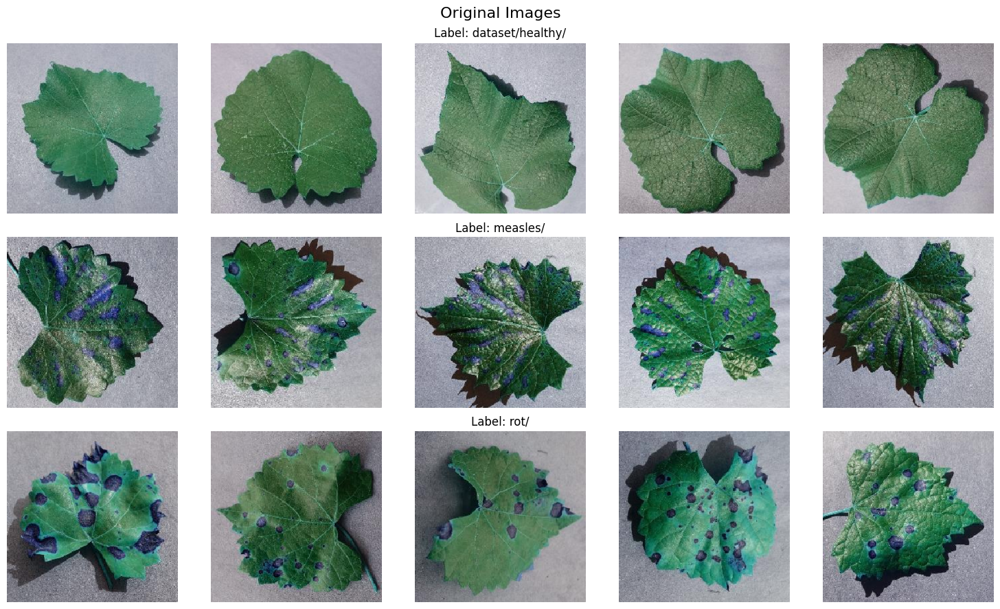

In [118]:
plot_samples(data, labels, 'Original Images')

## Data Preparation

### Data Augmentation

In [119]:
def getSize(image):
    height, width = image.shape[:2]
    return height, width

def rotate(image, rotation_degree=30):
    height, width = getSize(image)
    rotation_image = np.full((height, width, image.shape[2]), 255, dtype=np.uint8)  # Modify to handle color images
    angle = np.deg2rad(rotation_degree)
    center_x, center_y = height // 2, width // 2
    
    for i in range(height):
        for j in range(width):
            X = int((i - center_x) * np.cos(angle) - (j - center_y) * np.sin(angle) + center_x)
            Y = int((i - center_x) * np.sin(angle) + (j - center_y) * np.cos(angle) + center_y)
            if 0 <= X < height and 0 <= Y < width:
                rotation_image[i][j] = image[X][Y]
    return rotation_image

def mirrorX(image):
    height, width = getSize(image)
    sx = np.zeros_like(image)
    for i in range(height):
        for j in range(width):
            x = height - i - 1
            sx[i][j] = image[x][j]
    return sx

def mirrorY(image):
    height, width = getSize(image)
    sy = np.zeros_like(image)
    for i in range(height):
        for j in range(width):
            y = width - j - 1
            sy[i][j] = image[i][y]
    return sy

Cell code di atas mendeklarasikan beberapa fungsi untuk augmentasi gambar, di antaranya yaitu: "getSize", "rotate", "mirrorX", dan "mirrorY". Fungsi "getSize" mengambil gambar sebagai input dan mengembalikan tinggi dan lebar gambar tersebut. Fungsi "rotate" memutar gambar dengan sudut tertentu ("default" 30 derajat) dengan menginisialisasi gambar rotasi dengan warna putih, kemudian menghitung koordinat baru untuk setiap piksel dan memindahkan piksel gambar asli ke posisi yang baru. Fungsi "mirrorX" membalik gambar secara vertikal dengan mencerminkan piksel sepanjang sumbu X, sementara "mirrorY" membalik gambar secara horizontal dengan mencerminkan piksel sepanjang sumbu Y. Setiap fungsi menggunakan ukuran gambar yang diperoleh dari "getSize" untuk menentukan batas iterasi dalam operasi masing-masing.

In [120]:
def augment_image(image):
    rotated_image = rotate(image)
    mirroredX_image = mirrorX(image)
    mirroredY_image = mirrorY(image)

    return rotated_image, mirroredX_image, mirroredY_image

Cell code di atas merupakan deklarasi fungsi "augment_image" yang melakukan augmentasi terhadap sebuah gambar yang menjadi parameternya. Pertama, gambar akan diputar menggunakan fungsi "rotate". Kemudian, dilakukan pencerminan horizontal menggunakan fungsi "mirrorX" dan pencerminan vertikal menggunakan fungsi "mirrorY". Ketiga hasil augmentasi ini dikembalikan sebagai tuple yang berisi gambar yang telah diputar, gambar yang dicerminkan secara horizontal, dan gambar yang dicerminkan secara vertikal. Dengan demikian, fungsi ini memungkinkan untuk melakukan variasi terhadap gambar masukan, yang sering kali digunakan dalam proses augmentasi data untuk melatih model klasifikasi.

In [121]:
augmented_path = 'dataset/augmented/'
subdirectories = ['black_rot', 'esca_black_measles', 'healthy']

if not os.path.exists(augmented_path):
    os.makedirs(augmented_path)
for subdirectory in subdirectories:
    subdirectory_path = os.path.join(augmented_path, subdirectory)
    if not os.path.exists(subdirectory_path):
        os.makedirs(subdirectory_path)

Cell code di atas bertujuan untuk memastikan bahwa struktur direktori yang diperlukan untuk penyimpanan data "augmented" telah tersedia. Pertama, akan diperiksa keberadaan direktori "augmented_path". Jika direktori tersebut belum ada, maka akan dibuat dengan menggunakan "os.makedirs(augmented_path)". Selanjutnya, melakukan iterasi melalui daftar "subdirectories" yang berisi nama-nama subdirektori yang harus ada di dalam "augmented_path". Untuk setiap nama subdirektori, akan dibentuk path lengkap dengan "os.path.join(augmented_path, subdirectory)" dan memeriksa keberadaannya. Jika subdirektori belum ada, maka akan dibuat menggunakan "os.makedirs(subdirectory_path)". 

In [122]:
# augmented_data = []
# augmented_labels = []
# augmented_file_names = []

# for i, image in enumerate(data):
#     label = labels[i]
#     name = file_name[i]

#     rotated_image, mirroredX_image, mirroredY_image = augment_image(image)
#     images = [image, rotated_image, mirroredX_image, mirroredY_image]

#     if label == 'rot/':
#         subdirectory = 'black_rot'
#     elif label == 'measles/':
#         subdirectory = 'esca_black_measles'
#     elif label == 'dataset/healthy/':
#         subdirectory = 'healthy'
#     else:
#         print(f"Unknown label: {label}")
#         continue  

#     for j, img in enumerate(images):
#         aug_name = f"{name}_aug{j}.jpg"
#         save_path = os.path.join(augmented_path, subdirectory, aug_name)
#         cv.imwrite(save_path, img)
#         augmented_data.append(img)
#         augmented_labels.append(label)
#         augmented_file_names.append(aug_name)

In [123]:
foldersAug = [
    "dataset/augmented/black_rot/",
    "dataset/augmented/esca_black_measles/",
    "dataset/augmented/healthy/"
]
augmented_data = []
augmented_labels = []
augmented_file_names = []
for folder in foldersAug:
    label = folder.split('_')[-1]
    dataset = os.listdir(folder)
    for file in dataset:
        image_path = os.path.join(folder, file)
        name = os.path.splitext(file)[0]
        temp = cv.imread(image_path)
        augmented_data.append(temp)
        augmented_labels.append(label)
        augmented_file_names.append(name)

Cell code di atas berfungsi untuk memuat data gambar dari beberapa direktori yang telah ditentukan dalam "foldersAug", yaitu direktori untuk jenis data "black_rot", "esca_black_measles", dan "healthy" yang terletak di dalam path "dataset/augmented/". Selama iterasi melalui setiap direktori dalam "foldersAug". kode mengambil label dari nama direktori menggunakan "split" string untuk mendapatkan bagian terakhir setelah pemisahan dengan "_". Kemudian, proses mengambil daftar nama file dalam setiap direktori tersebut dan membaca setiap gambar menggunakan "cv.imread" dari pustaka "cv". Data gambar dimasukkan ke dalam list "augmented_data", sementara label dari setiap gambar dimasukkan ke dalam list "augmented_labels" dan nama file tanpa ekstensi dimasukkan ke dalam list "augmented_file_names". 

Cell code di bawah digunakan untuk menampilkan sampel gambar dengan memanggil fungsi "plot_samples" dengan memasukkan argument berupa list "augmented_data" dan list "augmented_labels" yang akan diproses, serta String untuk judul.

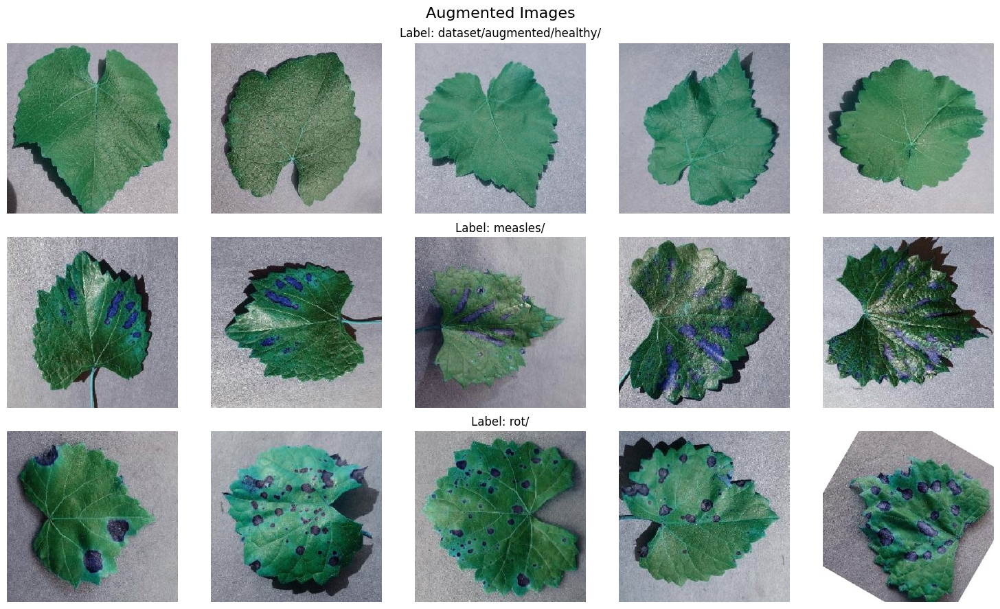

In [124]:
plot_samples(augmented_data, augmented_labels, 'Augmented Images')

## Preprocessing

In [125]:
def segment_leaf(image):
    hsv = cv.cvtColor(image, cv.COLOR_BGR2HSV)
    lower_green = np.array([35, 40, 40])
    upper_green = np.array([85, 255, 255])
    
    mask = cv.inRange(hsv, lower_green, upper_green)
    
    result = cv.bitwise_and(image, image, mask=mask)
    result[mask == 0] = [255, 255, 255]
    
    return result

Cell code di atas merupakan deklarasi fungsi "segment_leaf(image)" digunakan untuk memisahkan daerah hijau yang umumnya merepresentasikan daun dari gambar. Fungsi ini pertama-tama mengonversi gambar dari ruang warna BGR ke ruang warna HSV (Hue, Saturation, Value). Ruang warna HSV dipilih karena memisahkan informasi intensitas dari informasi warna, yang berguna untuk segmentasi berdasarkan warna. Selanjutnya, fungsi menentukan rentang warna hijau dalam format HSV menggunakan nilai batas bawah "lower_green" dan nilai batas atas "upper_green". Rentang warna hijau ini digunakan untuk membuat mask biner menggunakan fungsi "cv.inRange()", di mana piksel-piksel yang berada dalam rentang HSV yang ditentukan diatur menjadi putih (255), sedangkan yang diluar rentang diatur menjadi hitam (0). Kemudian, mask ini diterapkan pada gambar asli menggunakan "cv.bitwise_and()" untuk mengisolasi daerah hijau, menghasilkan gambar hasil segmentasi "result". Selain itu, daerah non-hijau dalam "result" diisi dengan warna putih ([255, 255, 255]) untuk meningkatkan kejelasan. Secara keseluruhan, fungsi "segment_leaf(image)" dapat digunakan secara efektif untuk mengidentifikasi dan memisahkan daerah-daerah hijau (daun) dalam gambar, sehingga mempermudah untuk analisis.

Cell code di bawah menggunakan pendekatan list comprehension untuk memanggil fungsi "segment_leaf(image)" pada setiap gambar yang terdapat dalam list "augmented_data". Setelah proses segmentasi selesai, hasilnya disimpan dalam list "segmented_data". Selanjutnya, hasil segmentasi ini ditampilkan dengan memanggil fungsi "plot_samples()", yang kemudian menampilkan gambar-gambar yang telah di-segmentasi bersama dengan label-label yang sesuai dari list "augmented_labels". Plot ini bertujuan untuk memberikan visualisasi dari hasil segmentasi pada gambar-gambar yang telah mengalami augmentasi, dengan judul plot yang ditetapkan sebagai 'Segmented Images'.

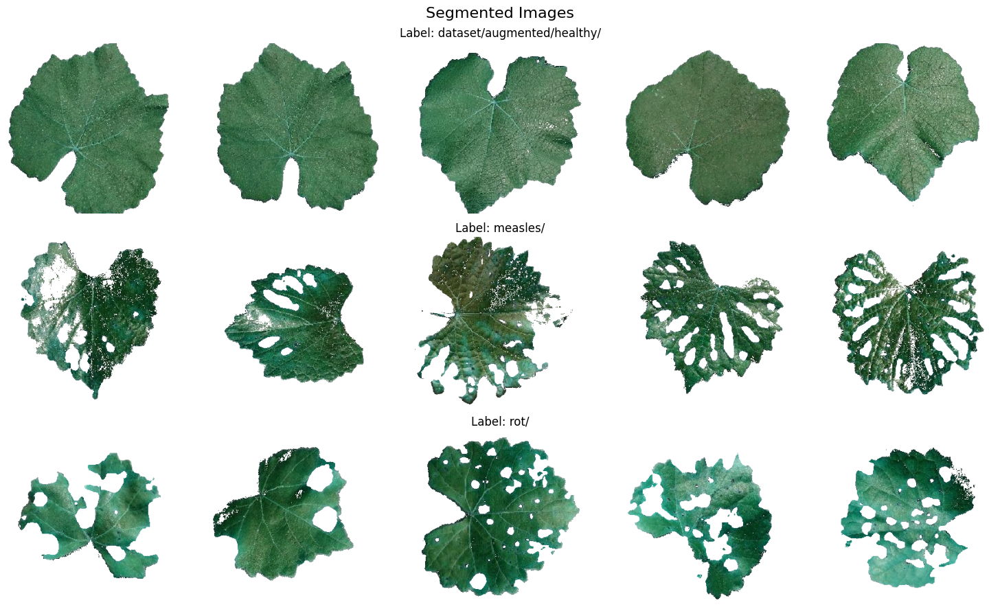

In [147]:
segmented_data = [segment_leaf(img) for img in augmented_data]
plot_samples(segmented_data, augmented_labels, 'Segmented Images')

In [127]:
def convert_to_grayscale(image):
    red = image[:, :, 0]
    green = image[:, :, 1]
    blue = image[:, :, 2]

    grayimage = (1/3 * red) + (1/3 * green) + (1/3 * blue)
    grayimage = grayimage.astype(int)
    
    return grayimage

Cell code di atas merupakan deklarasi fungsi "convert_to_grayscale(image)" mengubah gambar berwarna dalam format BGR menjadi citra skala abu-abu. Proses dimulai dengan ekstraksi saluran warna merah, hijau, dan biru dari gambar menggunakan indeksing "numpy". Setelah itu, nilai piksel untuk citra skala abu-abu dihitung dengan mengambil rata-rata dari nilai-nilai saluran warna merah, hijau, dan biru dengan bobot yang sama. Hasilnya kemudian dikonversi menjadi tipe data integer untuk representasi citra skala abu-abu. Fungsi ini mengembalikan citra skala abu-abu sebagai output akhir dan secara efektif menghilangkan informasi warna dan mempertahankan informasi intensitas dari gambar asli.

Cell code di bawah menggunakan pendekatan list comprehension untuk memanggil fungsi "convert_to_grayscale(image)" pada setiap gambar dalam list "segmented_data". Hasilnya disimpan dalam list "grayscale_data", yang berisi citra-citra yang telah dikonversi menjadi skala abu-abu. Setelah mendapatkan "grayscale_data", dan ditampilkan dengan memanggil fungsi "plot_samples()" untuk menampilkan sampel-sampel gambar dalam "grayscale_data" bersama dengan label-label yang sesuai dari list "augmented_labels". Plot ini dimaksudkan untuk memberikan visualisasi dari hasil konversi gambar ke citra skala abu-abu, dengan judul plot 'Gray Images'.

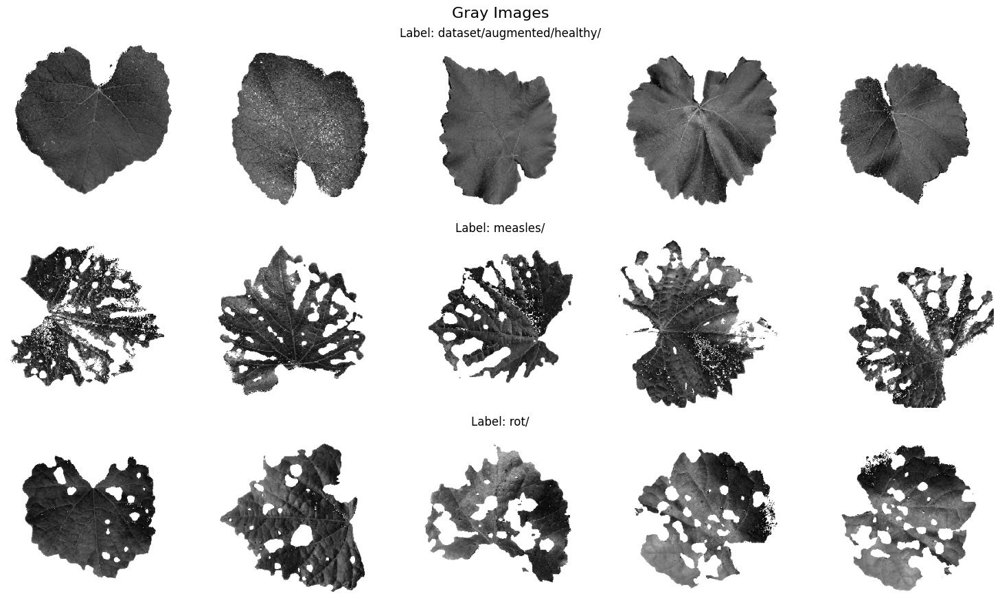

In [128]:
grayscale_data = [convert_to_grayscale(img) for img in segmented_data]
plot_samples(grayscale_data, augmented_labels, 'Gray Images')

In [129]:
def normalisasi(image):
    minValue = np.min(image)
    maxValue = np.max(image)
    normalize = (image - minValue) / (maxValue - minValue)
    return (normalize * 255).astype(np.uint8)

Cell code di atas merupakan deklarasi fungsi "normalisasi(image)" mengoperasikan normalisasi nilai piksel dalam gambar untuk mengubahnya ke dalam rentang 0-255. Pertama, fungsi ini menentukan nilai piksel minimum dan maksimum dari gambar menggunakan fungsi "np.min()" dan "np.max()" dari numpy. Selanjutnya, nilai piksel dalam gambar dinormalisasi menggunakan rumus "(image - minValue) / (maxValue - minValue)", sehingga nilai-nilai piksel tersebut disesuaikan agar berada dalam rentang antara 0 dan 1. Setelah itu, nilai-nilai hasil normalisasi tersebut dikalikan dengan 255 untuk mengalikannya kembali ke rentang 0-255. Akhirnya, hasil normalisasi diubah menjadi tipe data unsigned integer 8-bit ("np.uint8"), yang sesuai untuk representasi nilai piksel dalam gambar digital. Fungsi ini membantu memastikan konsistensi dalam representasi dan memudahkan proses analisis atau pengolahan lebih lanjut terhadap gambar-gambar yang dinormalisasi ini.

Cell code di bawah menggunakan list comprehension untuk memanggil fungsi "normalisasi(img)" pada setiap gambar dalam list "grayscale_data". Proses ini menghasilkan "normalized_data", yang merupakan list baru yang berisi gambar-gambar yang telah dinormalisasi, yaitu nilai pikselnya telah disesuaikan ke dalam rentang 0-255. Setelah normalisasi selesai, dan ditampilkan dengan memanggil fungsi "plot_samples()" untuk menampilkan sampel-sampel dari gambar-gambar yang telah dinormalisasi ("normalized_data"), bersama dengan label-label yang sesuai dari list "augmented_labels". Plot ini bertujuan untuk memberikan visualisasi dari hasil normalisasi gambar, dengan judul plot "Normalized Images".

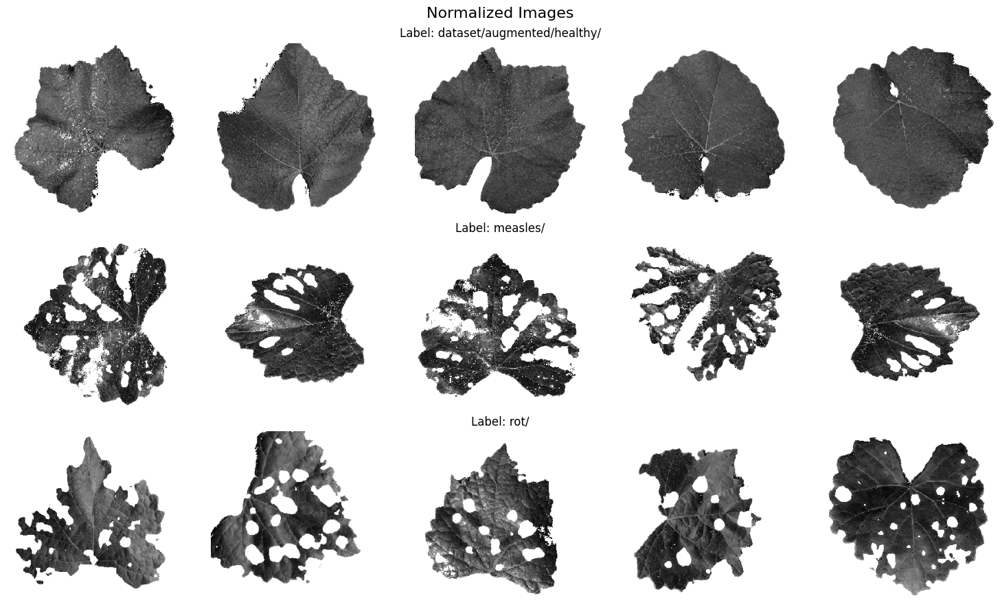

In [130]:
normalized_data = [normalisasi(img) for img in grayscale_data]
plot_samples(normalized_data, augmented_labels, 'Normalized Images')

In [131]:
def equalisasi(image):
    tinggi, lebar = image.shape
    jumlah = np.zeros(256).astype(int)

    for i in range(tinggi):
        for j in range(lebar):
            jumlah[int(image[i][j])] += 1
    
    hist_sum = np.zeros(256).astype(float)
    for i in range(256):
        hist_sum[i] = np.sum(jumlah[0:i+1])

    Target = (hist_sum * 255) / (tinggi * lebar)
    Target = np.round(Target).astype(int)
    Hasil = np.zeros(image.shape).astype(int)
    for i in range(tinggi):
        for j in range(lebar):
            Hasil[i][j] = Target[int(image[i][j])]
            
    return Hasil.astype(np.uint8), Target

Cell code di atas merupakan deklarasi fungsi "equalisasi(image)" dirancang untuk melakukan equalisasi histogram pada gambar grayscale. Proses dimulai dengan menghitung histogram gambar, yang merepresentasikan distribusi frekuensi kemunculan nilai piksel dari 0 hingga 255. Selanjutnya, fungsi menghitung histogram kumulatif ("hist_sum") untuk menentukan transformasi yang diperlukan untuk meratakan distribusi nilai piksel. Transformasi ini dihitung dengan mengalikan histogram kumulatif dengan faktor skala 255, kemudian dibagi dengan jumlah total piksel dalam gambar ("tinggi * lebar"). Hasil transformasi diterapkan pada setiap piksel gambar asli untuk menghasilkan gambar yang telah di-equalisasi ("Hasil"). Fungsi ini mengembalikan gambar yang telah di-equalisasi serta array "Target" yang memuat informasi transformasi histogram yang digunakan. Equalisasi histogram membantu meningkatkan kontras dan memperbaiki distribusi intensitas piksel dalam gambar, mempersiapkannya untuk analisis atau pemrosesan lebih lanjut dengan distribusi nilai piksel yang lebih merata.

Cell code di bawah menggunakan list comprehension untuk memanggil fungsi "equalisasi(img)[0]" pada setiap gambar dalam list "normalized_data". Fungsi "equalisasi(img)" mengembalikan tuple yang terdiri dari gambar yang telah di-equalisasi ("[0]"), dan array "Target" yang berisi informasi transformasi histogram. Oleh karena itu, "equalized_data" berisi gambar-gambar yang telah di-equalisasi dengan menggunakan histogram equalization. Setelah itu, ditampilkan dengan memanggil fungsi "plot_samples()" untuk menampilkan sampel-sampel dari gambar-gambar yang telah di-equalisasi ("equalized_data"), bersama dengan label-label yang sesuai dari list "augmented_labels". Plot ini bertujuan untuk memberikan visualisasi dari hasil equalisasi histogram pada gambar-gambar, dengan judul plot "Equalized Images".

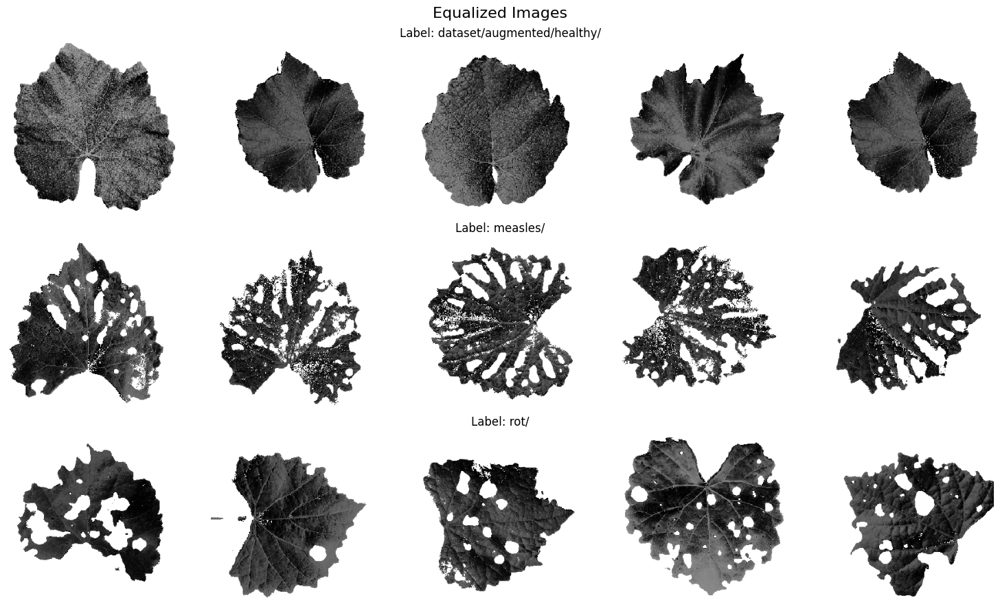

In [132]:
equalized_data = [equalisasi(img)[0] for img in normalized_data]
plot_samples(equalized_data, augmented_labels, 'Equalized Images')

Cell code di bawah menggunakan fungsi "apply_gaussian_blur(image, kernel_size=(5, 5), sigma=1)" untuk menerapkan Gaussian blur pada setiap gambar dalam list "equalized_data" yang dihasilkan sebelumnya. Fungsi "cv.GaussianBlur()" dari OpenCV digunakan untuk melakukan operasi Gaussian blur dengan parameter "image" sebagai gambar yang akan di-blur, "kernel_size" sebagai ukuran kernel blur (defaultnya adalah (5, 5)), dan "sigma" sebagai parameter kontrol untuk kehalusan blur (defaultnya adalah 1).
Setelah proses blur selesai, gambar-gambar yang telah di-blur disimpan dalam list "blurred_data". Kemudian, ditampilkan dengan memanggil fungsi "plot_samples()" untuk menampilkan sampel-sampel gambar yang telah di-blur ("blurred_data"), bersama dengan label-label yang sesuai dari list "augmented_labels". Plot ini bertujuan untuk memberikan visualisasi dari hasil blur pada gambar-gambar yang telah melalui proses equalisasi histogram, dengan judul plot "Blurred Images".

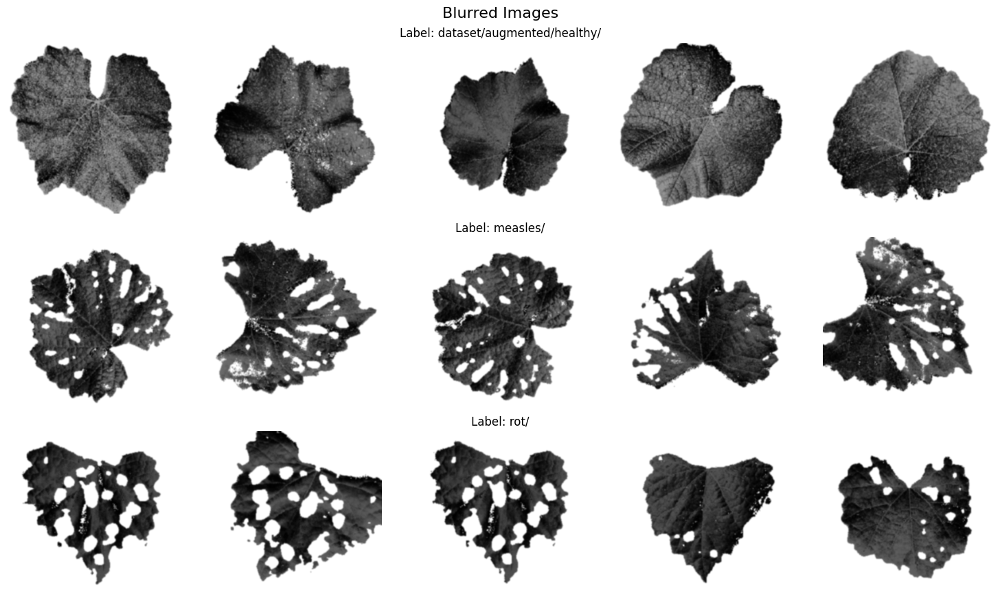

In [133]:
def apply_gaussian_blur(image, kernel_size=(5, 5), sigma=1):
    return cv.GaussianBlur(image, kernel_size, sigma)

blurred_data = [apply_gaussian_blur(img) for img in equalized_data]
plot_samples(blurred_data, augmented_labels, 'Blurred Images')

In [134]:
def padding(image, kernel):
    kernel_height, kernel_width = kernel.shape

    i = (kernel_width-1)//2
    j = (kernel_height-1)//2

    kiri = i
    kanan = (kernel_width-1)-i
    atas = j
    bawah = (kernel_height-1)-j
    result = np.pad(image, ((atas, bawah), (kiri, kanan)), 'edge')

    return result

def konvolusi(image, kernel):
    image_height, image_width = image.shape
    kernel_height, kernel_width = kernel.shape

    result = np.zeros(image.shape).astype(int)
    pad = padding(image, kernel)

    for i in range(image_height):
        for j in range(image_width):
            sum = 0
            for k in range(kernel_height):
                for l in range(kernel_width):
                    sum += pad[i+k][j+l] * kernel[k, l]

            result[i, j] = sum

    return result

def sobel(image):
    sobelX = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
    sobelY = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])
    edgeX = konvolusi(image, sobelX)
    edgeY = konvolusi(image, sobelY)

    edge_magnitude = np.sqrt(edgeX ** 2 + edgeY ** 2)
    edge_magnitude = (edge_magnitude / np.max(edge_magnitude) * 255).astype(np.uint8)
    
    return edge_magnitude

Cell code di atas adalah bagian dari deklarasi fungsi untuk proses pengolahan citra menggunakan metode konvolusi, dengan tujuan utama untuk melakukan deteksi tepi menggunakan filter Sobel. Pertama, fungsi "padding(image, kernel)" bertanggung jawab untuk menambahkan padding pada gambar "image" menggunakan teknik "edge padding" berdasarkan ukuran kernel "kernel". Padding ini penting agar operasi konvolusi dapat dilakukan secara penuh tanpa kehilangan informasi pada tepi gambar.

Selanjutnya, fungsi "konvolusi(image, kernel)" melakukan operasi konvolusi antara gambar "image" dan kernel "kernel". Proses konvolusi dilakukan dengan menggeser kernel di atas gambar dan menghitung hasil perkalian titik antara nilai piksel di area yang bertepatan dengan kernel dan nilai kernel itu sendiri. Hasil konvolusi ini disimpan dalam matriks "result", yang mewakili gambar hasil dari proses tersebut.

Terakhir, fungsi "sobel(image)" menerapkan filter Sobel untuk menghitung gradien dalam dua arah, yaitu horizontal (Sobel X) dan vertikal (Sobel Y), dari gambar "image". Filter Sobel digunakan untuk mendeteksi perubahan intensitas yang tajam, yang sering kali menandakan adanya tepi dalam gambar. Hasil konvolusi dengan kernel Sobel X dan Sobel Y disimpan dalam "edgeX" dan "edgeY" secara berturut-turut. Kemudian, magnitudo tepi dihitung sebagai akar kuadrat dari penjumlahan kuadrat "edgeX" dan "edgeY", yang memberikan representasi visual dari kekuatan perubahan intensitas dalam gambar. Hasil akhir ini dinormalisasi ke dalam rentang 0-255 dan dikonversi ke tipe data unsigned integer 8-bit ("np.uint8") untuk representasi gambar yang lebih mudah diproses dan divisualisasikan.

In [135]:
sobel_data = [sobel(img) for img in blurred_data]

Cell code di atas yaitu "sobel_data = [sobel(img) for img in blurred_data]" melakukan pengolahan citra menggunakan filter Sobel pada setiap gambar dalam "blurred_data". Filter Sobel digunakan untuk mendeteksi tepi dalam gambar dengan menghitung gradien dalam dua arah: horizontal (Sobel X) dan vertikal (Sobel Y). Proses ini dimulai dengan menerapkan Gaussian blur pada setiap gambar dalam "blurred_data" menggunakan "apply_gaussian_blur(img)" untuk mengurangi noise atau detail yang tidak diinginkan sebelum deteksi tepi dilakukan.

Fungsi "sobel(img)" kemudian dipanggil pada setiap gambar yang telah di-blur untuk melakukan operasi konvolusi dengan kernel Sobel X dan Sobel Y. Hasil konvolusi ini menghasilkan dua matriks "edgeX" dan "edgeY", yang masing-masing merepresentasikan gradien gambar dalam arah horizontal dan vertikal. Magnitudo tepi dihitung sebagai akar kuadrat dari penjumlahan kuadrat "edgeX" dan "edgeY", dan hasilnya dinormalisasi ke dalam rentang 0-255 untuk meningkatkan kontras dan memudahkan interpretasi visual. Akhirnya, "sobel_data" berisi gambar-gambar yang telah melalui proses deteksi tepi menggunakan filter Sobel.

Cell code di bawa yaitu "plot_samples(sobel_data, augmented_labels, 'Sobel Edge Detection')" akan menampilkan sampel-sampel dari "sobel_data", yang merupakan hasil dari deteksi tepi menggunakan filter Sobel pada gambar-gambar dalam dataset yang telah mengalami proses Gaussian blur sebelumnya. Setiap gambar dalam "sobel_data" mewakili visualisasi dari gradien tepi yang dihasilkan oleh filter Sobel dalam dua arah: horizontal dan vertikal.

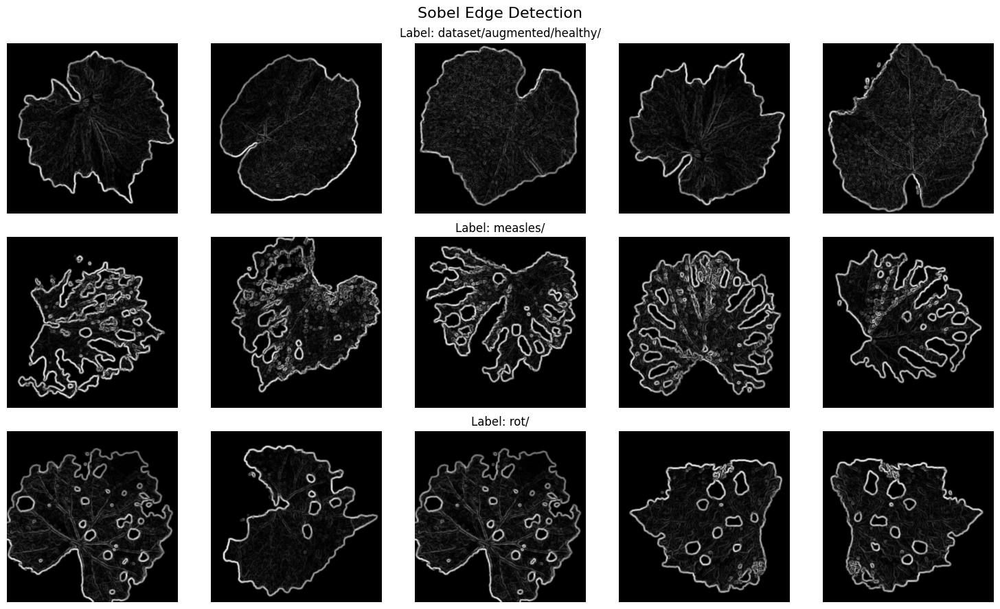

In [136]:
plot_samples(sobel_data, augmented_labels, 'Sobel Edge Detection')

## Feature Extraction

In [137]:
def is_index_valid(arr, i, j):
    return 0<=i<len(arr) and 0<=j<len(arr[0])

def norm_degree(image):
    sum = np.sum(image)
    return image/sum

def derajat0(image):
    result = np.zeros((256, 256))
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            if is_index_valid(image, i, j+1):
                result[image[i,j], image[i, j+1]] += 1
    result = result+result.T
    result = norm_degree(result)
    return result

def derajat90(image):
    result = np.zeros((256, 256))
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            if is_index_valid(image, i-1, j):
                result[image[i,j], image[i-1, j]] += 1
    result = result+result.T
    result = norm_degree(result)
    return result

def derajat45(image):
    result = np.zeros((256, 256))
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            if is_index_valid(image, i-1, j+1):
                result[image[i,j], image[i-1, j+1]] += 1
    result = result+result.T
    result = norm_degree(result)
    return result

def derajat135(image):
    result = np.zeros((256, 256))
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            if is_index_valid(image, i-1, j-1):
                result[image[i,j], image[i-1, j-1]] += 1
    result = result+result.T
    result = norm_degree(result)
    return result

Cell code di atas merupakan deklarasi beberapa fungsi yang digunakan untuk melakukan operasi pada gambar dan matriks untuk melakukan ekstraksi GLCM. Berikut adalah penjelasan untuk masing-masing fungsi:
- Deklarasi fungsi "is_index_valid" dengan dua parameter, yaitu "arr" dan "i", "j" Fungsi ini bertujuan untuk memeriksa apakah indeks "i" dan "j" valid dalam array dua dimensi "arr". Fungsi mengembalikan "True" jika indeks valid, yaitu jika "i" berada dalam rentang baris dan "j" berada dalam rentang kolom dari array "arr", dan "False" jika tidak.
- Deklarasi fungsi "norm_degree" dengan satu parameter berupa "image". Fungsi ini bertujuan untuk menormalisasi matriks image dengan menjumlahkan semua elemen dalam matriks dan membagi setiap elemen dengan jumlah tersebut. Fungsi ini mengembalikan matriks yang dinormalisasi.
- Deklarasi fungsi "derajat0" dengan satu parameter berupa "image". Fungsi ini bertujuan untuk menghitung matriks derajat co-occurrence pada sudut 0 derajat. Matriks hasil disimpan dalam "result" dan dihitung dengan menambahkan nilai "1" pada posisi yang sesuai dalam matriks untuk setiap pasangan piksel yang bersebelahan secara horizontal. Matriks hasil ditambahkan dengan transpose-nya sendiri dan kemudian dinormalisasi menggunakan fungsi "norm_degree".
- Deklarasi fungsi "derajat90" dengan satu parameter berupa "image". Fungsi ini bertujuan untuk menghitung matriks derajat co-occurrence pada sudut 90 derajat. Matriks hasil disimpan dalam "result" dan dihitung dengan menambahkan nilai "1" pada posisi yang sesuai dalam matriks untuk setiap pasangan piksel yang bersebelahan secara vertikal. Matriks hasil ditambahkan dengan transpose-nya sendiri dan kemudian dinormalisasi menggunakan fungsi "norm_degree".
- Deklarasi fungsi "derajat45" dengan satu parameter berupa "image". Fungsi ini bertujuan untuk menghitung matriks derajat co-occurrence pada sudut 45 derajat. Matriks hasil disimpan dalam result dan dihitung dengan menambahkan nilai "1" pada posisi yang sesuai dalam matriks untuk setiap pasangan piksel yang bersebelahan secara diagonal ke kanan atas. Matriks hasil ditambahkan dengan transpose-nya sendiri dan kemudian dinormalisasi menggunakan fungsi "norm_degree".
- Deklarasi fungsi "derajat135" dengan satu parameter berupa "image". Fungsi ini bertujuan untuk menghitung matriks derajat co-occurrence pada sudut 135 derajat. Matriks hasil disimpan dalam result dan dihitung dengan menambahkan nilai "1" pada posisi yang sesuai dalam matriks untuk setiap pasangan piksel yang bersebelahan secara diagonal ke kiri atas. Matriks hasil ditambahkan dengan transpose-nya sendiri dan kemudian dinormalisasi menggunakan fungsi "norm_degree".

In [138]:
def contrast(matriks):
    result = 0
    for i in range(matriks.shape[0]):
        for j in range(matriks.shape[1]):
            result += (i-j)**2 * matriks[i, j]
    return result

def dissimilarity(matriks):
    result = 0
    for i in range(matriks.shape[0]):
        for j in range(matriks.shape[1]):
            result += abs(i-j) * matriks[i, j]
    return result

def homogenity(matriks):
    result = 0
    for i in range(matriks.shape[0]):
        for j in range(matriks.shape[1]):
            result += matriks[i, j] / (1 + abs(i-j))
    return result

def entropy(matriks):
    result = 0
    for i in range(matriks.shape[0]):
        for j in range(matriks.shape[1]):
            if matriks[i, j] != 0:
                result -= matriks[i, j] * np.log2(matriks[i, j])
    return result

def asm(matriks):
    result = np.sum(matriks**2)
    return result

def energy(matriks):
    result = np.sqrt(np.sum(matriks**2))
    return result

def idxMiu(matriks):
    row, col = matriks.shape
    indices_i, indices_j = np.indices((row, col))
    miu_i = np.sum(indices_i * matriks)
    miu_j = np.sum(indices_j * matriks)
    return miu_i, miu_j

def standartDeviation(matriks):
    row, col = matriks.shape
    indices_i, indices_j = np.indices((row, col))
    miu_i, miu_j = idxMiu(matriks)
    standartDev_i = np.sqrt(np.sum((indices_i - miu_i)**2 * matriks))
    standartDev_j = np.sqrt(np.sum((indices_j - miu_j)**2 * matriks))
    return standartDev_i, standartDev_j

def correlation(matriks):
    row, col = matriks.shape
    indices_i, indices_j = np.indices((row, col))
    miu_i, miu_j = idxMiu(matriks)
    standartDev_i, standartDev_j = standartDeviation(matriks)
    result = np.sum((indices_i - miu_i) * (indices_j - miu_j) * matriks) / (standartDev_i * standartDev_j)
    return result

Cell code di atas merupakan deklarasi beberapa fungsi untuk menghitung berbagai fitur tekstur dari suatu matriks, yang akan digunakan dalam analisis GLCM. Setiap fungsi memiliki tujuan spesifik untuk menghitung metrik tertentu yang membantu dalam memahami sifat tekstur dari gambar. Fungsi "contrast" bertujuan untuk menghitung kontras dari suatu matriks dengan "result += (i-j)**2 * matriks[i, j]". Kontras adalah ukuran perbedaan intensitas atau kecerahan antara piksel bersebelahan dalam gambar. Semakin tinggi kontras, semakin besar perbedaan intensitas antar piksel. Fungsi "dissimilarity" bertujuan untuk menghitung dissimilaritas dari suatu matriks dengan "result += abs(i-j) * matriks[i, j]". Dissimilaritas mengukur perbedaan absolut antara pasangan piksel dalam gambar. Fungsi "homogenity" bertujuan untuk menghitung homogenitas dari suatu matriks dengan "result += matriks[i, j] / (1 + abs(i-j))". Homogenitas mengukur seberapa mirip nilai piksel dalam gambar. Semakin tinggi homogenitas, semakin sedikit variasi dalam intensitas piksel. Fungsi "entropy" bertujuan untuk menghitung entropi dari suatu matriks dengan "result -= matriks[i, j] * np.log2(matriks[i, j])". Entropi mengukur kekacauan atau ketidakpastian dalam gambar. Semakin tinggi entropi, semakin kompleks atau tidak teratur tekstur dalam gambar. Fungsi "asm" (Angular Second Moment) bertujuan untuk menghitung ASM dari suatu matriks dengan "result = np.sum(matriks ** 2)". ASM juga dikenal sebagai energi, dan mengukur homogenitas suatu gambar. Nilai ASM yang lebih tinggi menunjukkan tekstur yang lebih homogen. Fungsi "energy" bertujuan untuk menghitung energi dari suatu matriks dengan " result = np.sqrt(np.sum(matriks ** 2))". Energi adalah akar kuadrat dari ASM, dan juga mengukur homogenitas gambar. Fungsi "idxMiu" bertujuan untuk menghitung mean indeks baris ("miu_i") dan mean indeks kolom ("miu_j") dari suatu matriks. Mean indeks ini digunakan untuk menghitung standar deviasi dan korelasi. Fungsi "standartDeviation" bertujuan untuk menghitung standar deviasi dari indeks baris ("standartDev_i") dan indeks kolom ("standartDev_j"). Standar deviasi mengukur seberapa jauh nilai piksel menyebar dari mean. Terakhir adalah fungsi "correlation" bertujuan untuk menghitung korelasi dari suatu matriks. Korelasi mengukur seberapa suatu piksel pada gambar terkait dengan piksel lain. Korelasi yang tinggi menunjukkan hubungan yang kuat antara pasangan piksel.

In [139]:
def extract_glcm_features(image):
    glcm_0 = derajat0(image)
    glcm_45 = derajat45(image)
    glcm_90 = derajat90(image)
    glcm_135 = derajat135(image)
    
    features = []
    
    for glcm in [glcm_0, glcm_45, glcm_90, glcm_135]:
        features.append(contrast(glcm))
        features.append(dissimilarity(glcm))
        features.append(homogenity(glcm))
        features.append(entropy(glcm))
        features.append(asm(glcm))
        features.append(energy(glcm))
        features.append(correlation(glcm))
    
    return features

Cell code di atas merupakan deklarasi fungsi dengan nama "extract_glcm_features" yang menerima satu parameter berupa "image". Fungsi "extract_glcm_features" bertujuan untuk mengekstraksi fitur-fitur dari gambar menggunakan Gray Level Co-occurrence Matrix (GLCM) pada berbagai derajat orientasi dengan memanggil fungsi untuk derajat yang sesuai. "features = []:" merupakan list kosong untuk menyimpan fitur-fitur yang akan diekstraksi dari GLCM. Kemudian melakukan looping untuk setiap GLCM yang telah dihitung pada berbagai orientasi, dan berbagai fitur dihitung dari masing-masing GLCM dan ditambahkan ke dalam list features dengan fungsi "append". Setelah iterasi berakhir, fungsi ini akan mengembalikan list "features" yang berisi fitur-fitur yang telah diekstraksi dari berbagai GLCM.
Ringkasan.

In [140]:
glcm_features = []
for image in sobel_data:
    glcm_features.append(extract_glcm_features(image))

glcm_df = pd.DataFrame(glcm_features, columns=[
    'contrast_0', 'dissimilarity_0', 'homogenity_0', 'entropy_0', 'asm_0', 'energy_0', 'correlation_0',
    'contrast_45', 'dissimilarity_45', 'homogenity_45', 'entropy_45', 'asm_45', 'energy_45', 'correlation_45',
    'contrast_90', 'dissimilarity_90', 'homogenity_90', 'entropy_90', 'asm_90', 'energy_90', 'correlation_90',
    'contrast_135', 'dissimilarity_135', 'homogenity_135', 'entropy_135', 'asm_135', 'energy_135', 'correlation_135'
])

glcm_df['label'] = augmented_labels

glcm_df.to_csv('feature_extraction_after.csv', index=False)

Cell code di atas bertujuan untuk mengekstrak fitur GLCM (Gray Level Co-occurrence Matrix) dari setiap gambar dalam list "sobe;_data", dan menyimpan hasilnya ke dalam "DataFrame". Fitur-fitur GLCM ini kemudian disimpan dalam file CSV. "glcm_features = []:" merupakan list kosong yang akan diisi dengan fitur-fitur GLCM dari setiap gambar. Kemudian melakukan looping pada setiap gambar dalam list "data" dan memanggil fungsi "extract_glcm_features" untuk mengekstrak fitur GLCM dari gambar, dan menambahkan hasilnya ke list glcm_features dengan "append". "pd.DataFrame" digunakan untuk membuat DataFrame "glcm_df" dari list "glcm_features", dengan kolom yang dinamai sesuai fitur GLCM yang diekstrak pada empat sudut (0, 45, 90, dan 135 derajat). Nama kolom diatur untuk masing-masing fitur, yaitu "contrast, dissimilarity, homogenity, entropy, asm, energy, dan correlation". Terakhir adalah menambahkan label dan menyimpan hasil "DataFrame" ke dalam file CSV.

Cell code di bawah digunakan untuk menampilkan DataFrame "glcm_df" yanng telah dihasilkan. DataFrame berisi 232 baris data serta 29 kolom fitur ekstraksi.

In [141]:
glcm_df

,contrast_0,dissimilarity_0,homogenity_0,entropy_0,asm_0,energy_0,correlation_0,contrast_45,dissimilarity_45,homogenity_45,...,energy_90,correlation_90,contrast_135,dissimilarity_135,homogenity_135,entropy_135,asm_135,energy_135,correlation_135,label
0,310.026265,7.855162,0.538595,7.754813,0.178568,0.422574,0.881050,472.849834,9.646022,0.523863,...,0.423369,0.907495,510.644512,10.148544,0.520163,7.925405,0.175634,0.419088,0.804542,rot/
1,283.010111,7.509554,0.542952,7.743867,0.178851,0.422908,0.893887,440.200747,9.346171,0.525364,...,0.423021,0.896597,551.226664,10.551414,0.517055,7.962692,0.175352,0.418751,0.793806,rot/
2,307.173378,7.838283,0.538500,7.748893,0.178345,0.422310,0.881462,504.462556,10.110278,0.519686,...,0.423126,0.907813,470.755685,9.606995,0.524205,7.890590,0.175366,0.418767,0.818767,rot/
3,314.510346,7.903099,0.538493,7.757110,0.178719,0.422751,0.880655,521.663997,10.264035,0.518739,...,0.423580,0.906906,474.777430,9.642812,0.524118,7.896484,0.175793,0.419277,0.820267,rot/
4,390.266355,7.373891,0.647765,6.185560,0.298536,0.546384,0.898546,762.564334,10.416908,0.629737,...,0.546626,0.908012,627.865997,9.206922,0.636830,6.290117,0.294487,0.542667,0.837232,rot/
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1523,204.313133,6.769186,0.528123,7.769353,0.166422,0.407948,0.880332,342.820080,8.822631,0.507859,...,0.408264,0.899901,313.633047,8.316037,0.510941,7.915008,0.163699,0.404597,0.816707,dataset/augmented/healthy/
1524,239.806711,7.413244,0.523909,7.721335,0.176441,0.420049,0.863827,348.383083,8.878737,0.510321,...,0.420820,0.899634,380.571783,9.277726,0.508010,7.862633,0.173793,0.416885,0.784363,dataset/augmented/healthy/
1525,208.824638,6.963411,0.528770,7.686690,0.176700,0.420357,0.880169,297.241530,8.382971,0.512234,...,0.420320,0.883631,413.896153,9.567298,0.506414,7.873954,0.173530,0.416569,0.763004,dataset/augmented/healthy/
1526,238.489409,7.410881,0.523757,7.732206,0.175582,0.419026,0.863575,377.581929,9.278062,0.507557,...,0.419909,0.900047,346.448720,8.900728,0.509120,7.849367,0.172804,0.415697,0.802247,dataset/augmented/healthy/


### Splitting Data

In [142]:
X = glcm_df.drop(columns=['label'])
y = glcm_df['label']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

Cell code di atas bertujuan untuk mempersiapkan data yang akan digunakan dalam proses pelatihan dan pengujian model klasifikasi yang dibuat. Deklarasi "X = glcm_df.drop(columns=['label'])" merupakan perintah untuk memisahkan fitur dari dataset dengan menghapus kolom "label" dari "glcm_df". Deklarasi "y = glcm_df['label']" digunakan untuk menyimpan kolom "label" ke dalam variabel "y", yang berisi label dari masing-masing sampel. Selanjutnya, dilakukan pembagian dataset menjadi subset pelatihan dan pengujian menggunakan "train_test_split" dari "sklearn.model_selection". Deklarasi "X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)" membagi data fitur "X" dan label "y" ke dalam data pelatihan (X_train, y_train) dan data pengujian (X_test, y_test). "test_size=0.2" menunjukkan bahwa 20% (8:2) dari data akan digunakan sebagai data pengujian, dan "random_state=42" digunakan untuk memastikan bahwa pembagian data konsisten di setiap eksekusi.

### Normalization

In [143]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

Cell code di atas merupakan deklarasi untuk menormalisasikan fitur dalam dataset pelatihan dan pengujian menggunakan "StandardScaler". Proses ini penting untuk memastikan bahwa setiap fitur memiliki skala yang sama, yang dapat meningkatkan kinerja model. "fit_transform" menggabungkan dua langkah (fit dan transform) dalam satu baris kode, dan hasilnya adalah "X_train_scaled" dan "X_test_scaled", yaitu data pelatihan  dan pengujian yang telah distandarisasi.

## Modeling

In [144]:
# K-Nearest Neighbors (KNN)
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train_scaled, y_train)
y_pred_knn = knn.predict(X_test_scaled)

# Support Vector Machine (SVM)
svm = SVC(kernel='linear', C=1)
svm.fit(X_train_scaled, y_train)
y_pred_svm = svm.predict(X_test_scaled)

# Random Forest
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train_scaled, y_train)
y_pred_rf = rf.predict(X_test_scaled)

Cell code di atas bertujuan untuk melatih dan memprediksi data menggunakan tiga model klasifikasi yang berbeda: K-Nearest Neighbors (KNN), Support Vector Machine (SVM), dan Random Forest. Setiap model dilatih menggunakan data pelatihan yang telah diskalakan, dan prediksi dilakukan pada data pengujian yang juga telah diskalakan. Hasil prediksi kemudian disimpan dalam variabel yang sesuai.
- Deklarasi "knn = KNeighborsClassifier(n_neighbors=5)" merupakan inisialisasi model KNN dengan parameter "n_neighbors" yang di-set dengan nilai "5". Model ini menggunakan algoritma KNN yang bekerja dengan mencari lima tetangga terdekat untuk setiap sampel baru dan memprediksi kelas berdasarkan mayoritas kelas dari tetangga-tetangga tersebut. "knn.fit(X_train_scaled, y_train)" digunakan untuk melatih model KNN menggunakan data pelatihan yang telah diskalakan (X_train_scaled) dan label pelatihan (y_train). "y_pred_knn = knn.predict(X_test_scaled)" digunakan untuk melakukan prediksi pada data pengujian yang telah diskalakan (X_test_scaled) dan menyimpan hasil prediksi ke dalam variabel "y_pred_knn".
- Deklarasi "svm = SVC(kernel='linear', C=1)" merupakan inisialisasi model SVM dengan parameter kernel yang di-set dengan "linear" dan "C" yang di-set dengan nilai "1". Model ini menggunakan SVM dengan kernel linear yang bekerja dengan mencari hyperplane terbaik yang memisahkan kelas-kelas dalam data dengan margin maksimum. "svm.fit(X_train_scaled, y_train)" digunakan untuk melatih model KNN menggunakan data pelatihan yang telah diskalakan (X_train_scaled) dan label pelatihan (y_train). "y_pred_svm = svm.predict(X_test_scaled)" digunakan untuk melakukan prediksi pada data pengujian yang telah diskalakan (X_test_scaled) dan menyimpan hasil prediksi ke dalam variabel "y_pred_svm".
- Deklarasi "rf = RandomForestClassifier(n_estimators=100, random_state=42)" merupakan inisialisasi model Random Forest dengan parameter "n_estimators" yang di-set dengan nilai "100" dan "random_state" yang di-set dengan nilai "42". Model ini menggunakan algoritma Random Forest yang bekerja dengan membangun "100" pohon keputusan dan menggabungkan hasilnya untuk meningkatkan akurasi dan mengurangi overfitting. "rf.fit(X_train_scaled, y_train)" digunakan untuk melatih model RF menggunakan data pelatihan yang telah diskalakan (X_train_scaled) dan label pelatihan (y_train). "rf = rf.predict(X_test_scaled)" digunakan untuk melakukan prediksi pada data pengujian yang telah diskalakan (X_test_scaled) dan menyimpan hasil prediksi ke dalam variabel "y_pred_rf".

## Evaluation

In [145]:
def evaluate_model(y_test, y_pred, model_name, labels):
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    cm = confusion_matrix(y_test, y_pred, labels=labels)

    print(f'{model_name} Model')
    print('Accuracy:', accuracy)
    print('Precision:', precision)
    print('Recall:', recall)
    print('F1 Score:', f1)
    print('Confusion Matrix:')

    plt.figure(figsize=(10, 7))
    ax = sns.heatmap(cm, annot=True, fmt='d', cmap='BuPu', xticklabels=labels, yticklabels=labels)
    ax.set_yticklabels(ax.get_yticklabels(), rotation=90)

    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f'Confusion Matrix: {model_name}')
    plt.show()

Cellcode di atas berupa deklarasi fungsi "" dengan parameter berupa "y_test", "y_pred", "model_name", "labels" yang telah didapatkan sebelumnya. Fungsi ini digunakan untuk mengevaluasi kinerja model klasifikasi dengan menggunakan beberapa metrik evaluasi dan menampilkan confusion matrix-nya. "accuracy = accuracy_score(y_test, y_pred)" digunakan utnuk menghitung akurasi model menggunakan "accuracy_score". "precision = precision_score(y_test, y_pred, average='weighted')" digunakan untuk menghitung presisi model menggunakan "precision_score" dengan rata-rata "weighted". "recall = recall_score(y_test, y_pred, average='weighted')" digunakan untuk menghitung recall (sensitivitas) model menggunakan "recall_score" dengan rata-rata "weighted". "f1 = f1_score(y_test, y_pred, average='weighted')" digunakan untuk menghitung F1-score model menggunakan "f1_score" dengan rata-rata "weighted". Kemudian dilakukan perhitungan matriks confusion menggunakan "confusion_matrix" dengan label kelas yang ada. Masing-masing hasil perhitungan akan ditampilkan dengan "print()" dan juga confusion matriks divisualisasikan dengan menggunakan heatmap.


Cell code di bawah berguna untuk melakukan evaluasi dari tiga model klasifikasi yang berbeda menggunakan metrik yang sesuai untuk setiap modelnya dengan memanggil fungsi "evaluate_model" yang telah dideklarasikan sebelumnya. Evaluasi dilakukan dengan membandingkan prediksi ("y_pred_knn", "y_pred_svm", "y_pred_rf") terhadap label sebenarnya ("y_test"). "unique_labels = np.unique(y)" digunakan untuk mendapatkan label unik dari dataset yang digunakan.

KNN Model
Accuracy: 0.9901960784313726
Precision: 0.990422322775264
Recall: 0.9901960784313726
F1 Score: 0.9902098823665021
Confusion Matrix:


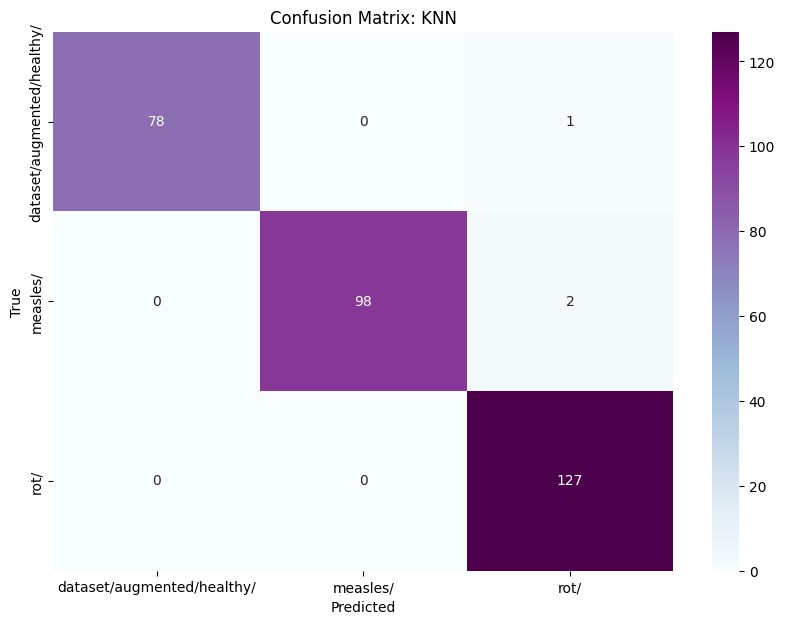

SVM Model
Accuracy: 0.9901960784313726
Precision: 0.9902879901960784
Recall: 0.9901960784313726
F1 Score: 0.9901925686174124
Confusion Matrix:


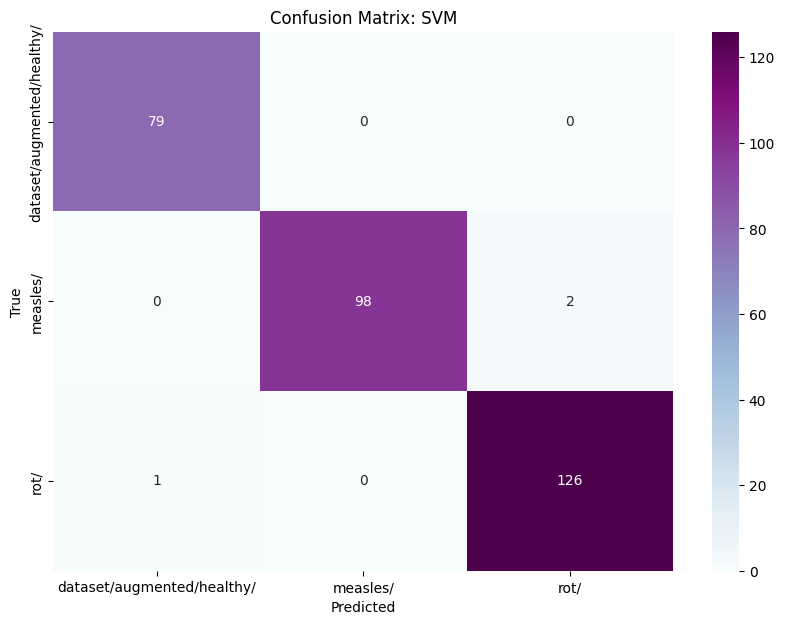

Random Forest Model
Accuracy: 1.0
Precision: 1.0
Recall: 1.0
F1 Score: 1.0
Confusion Matrix:


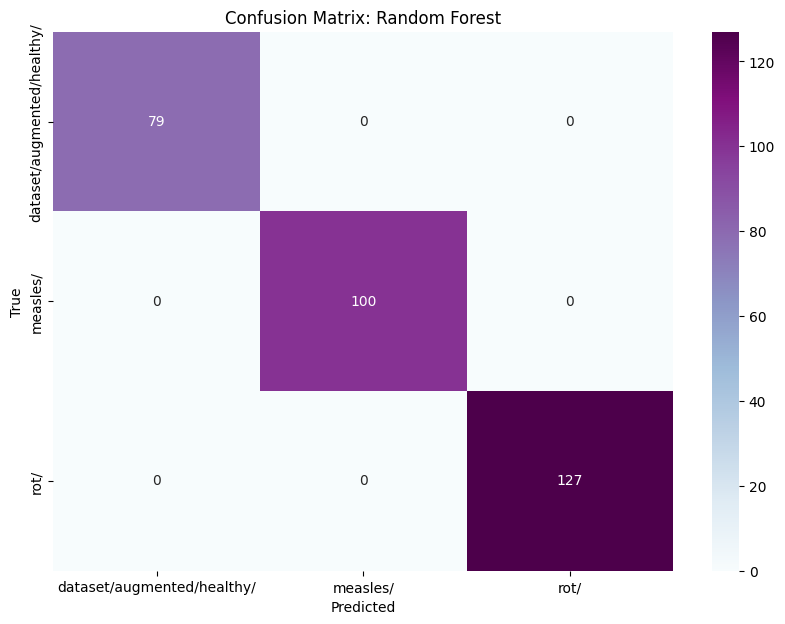

In [146]:
unique_labels = np.unique(y)

evaluate_model(y_test, y_pred_knn, 'KNN', unique_labels)
evaluate_model(y_test, y_pred_svm, 'SVM', unique_labels)
evaluate_model(y_test, y_pred_rf, 'Random Forest', unique_labels)